N series	
N points	
Frequency	
Heterogeneity	
Trend	
Seasonality	
Sparce (либо есть нулевые значения, либо есть пропуски и их надо обрабатывать)	
Exog. variables	
Take for further analysis? 		
Level shift по крайней мере в одном  ряде

In [5]:
import pandas as pd
import numpy as np

from utils import convert_tsf_to_dataframe, describe_ts, draw_resampled, cluster_ts, plot_clustered_series, calculate_tau, calculate_slope

# Temperature Rain Dataset without Missing Values

This dataset contains 32072 daily time series showing the temperature observations and rain forecasts, gathered by the Australian Bureau of Meteorology for 422 weather stations across Australia, between 02/05/2015 and 26/04/2017.

The original dataset contains missing values and they have been simply replaced by zeros.

In [6]:
file_temperature_rain = '/media/olga/Disk/datasets_ts/temperature_rain_dataset_without_missing_values.tsf'
loaded_data, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(file_temperature_rain)

In [7]:
loaded_data

,series_name,station_id,obs_or_fcst,start_timestamp,value
0,T0,1006,T_MEAN,2015-05-02 15:00:00,"[24.79167, 25.11667, 26.84167, 27.87917, 28.34..."
1,T1,1006,PRCP_SUM,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,T2,1006,T_MAX,2015-05-02 15:00:00,"[35.8, 36.6, 38.7, 38.6, 35.9, 33.6, 33.8, 34...."
3,T3,1006,T_MIN,2015-05-02 15:00:00,"[15.7, 15.3, 16.7, 18.8, 20.9, 20.1, 15.9, 16...."
4,T4,1006,fcst_0_DailyPoP,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...
32067,T32067,200786,fcst_5_DailyPrecip,2015-05-02 15:00:00,"[0.41911, 0.80749, 1.27236, 2.36317, 0.69048, ..."
32068,T32068,200786,fcst_5_DailyPrecip10Pct,2015-05-02 15:00:00,"[1.27522, 2.31377, 3.90345, 7.31868, 2.12006, ..."
32069,T32069,200786,fcst_5_DailyPrecip25Pct,2015-05-02 15:00:00,"[0.2614, 0.19993, 0.60498, 1.19046, 0.40992, 0..."
32070,T32070,200786,fcst_5_DailyPrecip50Pct,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [8]:
frequency

'daily'

In [17]:
forecast_horizon

In [18]:
contain_missing_values

False

In [19]:
contain_equal_length

True

In [24]:
value_counts = loaded_data['obs_or_fcst'].value_counts()
value_counts

obs_or_fcst
T_MEAN                     422
fcst_3_DailyPrecip10Pct    422
fcst_4_DailyPoP15          422
fcst_4_DailyPoP10          422
fcst_4_DailyPoP1           422
                          ... 
fcst_1_DailyPrecip10Pct    422
fcst_1_DailyPrecip         422
fcst_1_DailyPoP50          422
fcst_1_DailyPoP5           422
fcst_5_DailyPrecip75Pct    422
Name: count, Length: 76, dtype: int64

In [21]:
station_id_counts = loaded_data['station_id'].value_counts()
station_id_counts

station_id
1006      76
61392     76
68239     76
68228     76
68192     76
          ..
23887     76
23885     76
23878     76
23875     76
200786    76
Name: count, Length: 422, dtype: int64

In [22]:
loaded_data['start_timestamp'] = pd.to_datetime(loaded_data['start_timestamp'])

In [23]:
loaded_data.dtypes

series_name                object
station_id                 object
obs_or_fcst                object
start_timestamp    datetime64[ns]
value                      object
dtype: object

In [24]:
# n-series
n_series = loaded_data['series_name'].nunique()
n_series

32072

In [25]:
max(loaded_data['value'].apply(len)) # max N points

725

In [26]:
min(loaded_data['value'].apply(len)) # min N points

725

Гетерогенность: ряды очень разнородны
В столбце obs_or_fcst определены разные типы метеорологических показателей. 

Разделим их на группы:
Температура: T-MEAN, T-MIN, T-MAX

Осадки и прогнозы осадков:

PRCP_SUM: Суммарное количество осадков.
fcst_X_DailyPoP: Прогноз вероятности осадков (PoP - Probability of Precipitation) на X-й день.
fcst_X_DailyPrecip: Прогноз суммарного количества осадков на X-й день.
fcst_X_DailyPrecipXPct: Прогноз количества осадков на X-й день, который покрывает XPct процентов случаев.

Обратите внимание, что fcst_X означает, что это прогноз на X-й день вперёд от текущей даты.

Типы fcst_X_DailyPoP и fcst_X_DailyPrecip могут иметь дополнительные метрики, такие как 10Pct, 25Pct, 50Pct, 75Pct, указывающие на разные квантили.

In [9]:
loaded_data

,series_name,station_id,obs_or_fcst,start_timestamp,value
0,T0,1006,T_MEAN,2015-05-02 15:00:00,"[24.79167, 25.11667, 26.84167, 27.87917, 28.34..."
1,T1,1006,PRCP_SUM,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,T2,1006,T_MAX,2015-05-02 15:00:00,"[35.8, 36.6, 38.7, 38.6, 35.9, 33.6, 33.8, 34...."
3,T3,1006,T_MIN,2015-05-02 15:00:00,"[15.7, 15.3, 16.7, 18.8, 20.9, 20.1, 15.9, 16...."
4,T4,1006,fcst_0_DailyPoP,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...,...
32067,T32067,200786,fcst_5_DailyPrecip,2015-05-02 15:00:00,"[0.41911, 0.80749, 1.27236, 2.36317, 0.69048, ..."
32068,T32068,200786,fcst_5_DailyPrecip10Pct,2015-05-02 15:00:00,"[1.27522, 2.31377, 3.90345, 7.31868, 2.12006, ..."
32069,T32069,200786,fcst_5_DailyPrecip25Pct,2015-05-02 15:00:00,"[0.2614, 0.19993, 0.60498, 1.19046, 0.40992, 0..."
32070,T32070,200786,fcst_5_DailyPrecip50Pct,2015-05-02 15:00:00,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [10]:
def melt_segment(segment, id_column="id", var_column="obs_or_fcst",value_column="value", date_column="date"):
    n_values = len(segment["value"].values[0])
    df_dict = {
        "id": np.repeat(segment[id_column].iloc[0], n_values),
        "obs_or_fcst": np.repeat(segment[var_column].iloc[0], n_values),
        "date": pd.date_range(segment[date_column].iloc[0], periods=n_values, freq="D"),
        "value": segment[value_column].values[0]
    }
    return pd.DataFrame(df_dict)

In [11]:
temperature_rain = loaded_data.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
temperature_rain["date"] = pd.to_datetime(temperature_rain["date"])
temperature_rain['id'] = temperature_rain['id'].astype('category').cat.codes

In [12]:
new_df_list = []
for _, segment in temperature_rain.groupby("id"):
    new_df_list.append(melt_segment(segment))

In [13]:
temperature_rain = pd.concat(new_df_list)
temperature_rain

,id,obs_or_fcst,date,value
0,0,T_MEAN,2015-05-02 15:00:00,24.79167
1,0,T_MEAN,2015-05-03 15:00:00,25.11667
2,0,T_MEAN,2015-05-04 15:00:00,26.84167
3,0,T_MEAN,2015-05-05 15:00:00,27.87917
4,0,T_MEAN,2015-05-06 15:00:00,28.34167
...,...,...,...,...
720,32071,fcst_3_DailyPoP15,2017-04-21 15:00:00,10.00000
721,32071,fcst_3_DailyPoP15,2017-04-22 15:00:00,0.00000
722,32071,fcst_3_DailyPoP15,2017-04-23 15:00:00,0.00000
723,32071,fcst_3_DailyPoP15,2017-04-24 15:00:00,0.00000


In [14]:
temperature_rain.to_csv('./temperature_rain.csv', index=False)

T_MEAN

In [15]:
temp_rain_tmean = temperature_rain[(temperature_rain['obs_or_fcst'] == 'T_MEAN')]
temp_rain_tmean

,id,obs_or_fcst,date,value
0,0,T_MEAN,2015-05-02 15:00:00,24.79167
1,0,T_MEAN,2015-05-03 15:00:00,25.11667
2,0,T_MEAN,2015-05-04 15:00:00,26.84167
3,0,T_MEAN,2015-05-05 15:00:00,27.87917
4,0,T_MEAN,2015-05-06 15:00:00,28.34167
...,...,...,...,...
720,32024,T_MEAN,2017-04-21 15:00:00,17.30000
721,32024,T_MEAN,2017-04-22 15:00:00,19.11600
722,32024,T_MEAN,2017-04-23 15:00:00,17.27600
723,32024,T_MEAN,2017-04-24 15:00:00,16.02400


In [16]:
describe_ts(temp_rain_tmean)

Число рядов: 422
Наблюдений в ряде: [725]
Минимальная дата в ряде: 2015-05-02 15:00:00
Максимальная дата в ряде: 2017-04-25 15:00:00, 

count    305950.000000
mean         18.205338
std           7.459333
min          -7.966670
25%          12.433330
50%          17.987500
75%          24.200000
max          39.662500
Name: value, dtype: float64


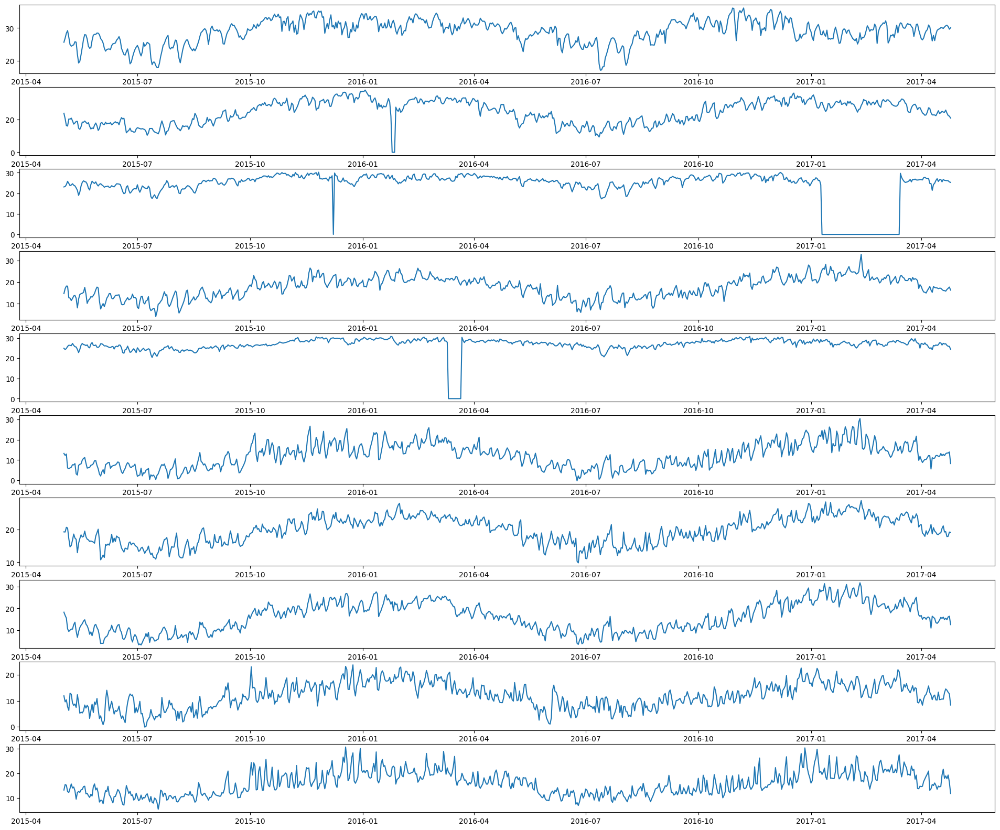

In [17]:
draw_resampled(temp_rain_tmean, 'D', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


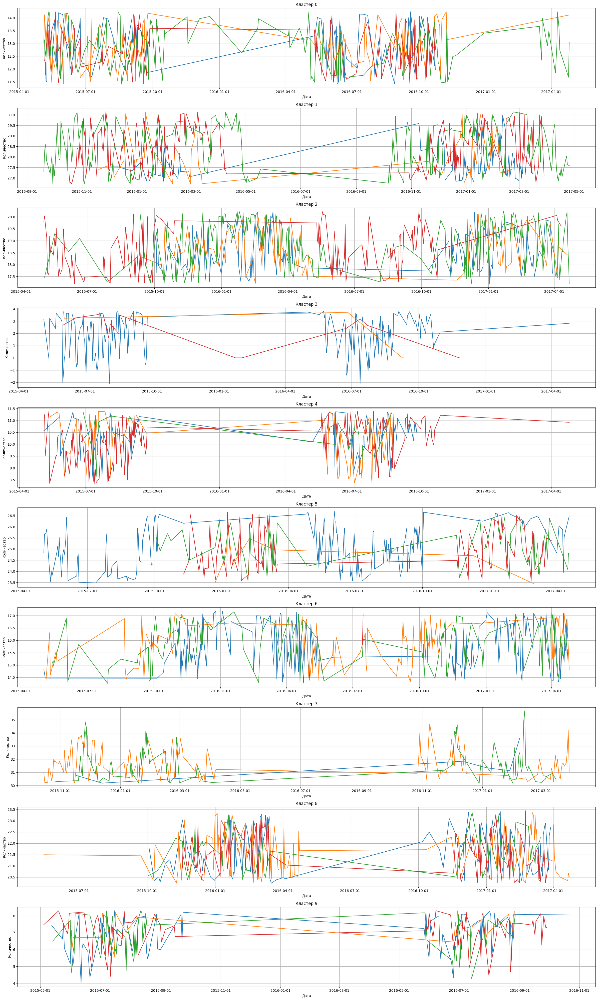

In [18]:
temperature_rain_cluster = cluster_ts(temp_rain_tmean, 10)
plot_clustered_series(temperature_rain_cluster, 10, n_series=4)

In [19]:
temp_rain_tmax = temperature_rain[(temperature_rain['obs_or_fcst'] == 'T_MAX')]
temp_rain_tmax

,id,obs_or_fcst,date,value
0,42,T_MAX,2015-05-02 15:00:00,19.4
1,42,T_MAX,2015-05-03 15:00:00,26.8
2,42,T_MAX,2015-05-04 15:00:00,15.6
3,42,T_MAX,2015-05-05 15:00:00,15.3
4,42,T_MAX,2015-05-06 15:00:00,14.9
...,...,...,...,...
720,32026,T_MAX,2017-04-21 15:00:00,24.7
721,32026,T_MAX,2017-04-22 15:00:00,25.9
722,32026,T_MAX,2017-04-23 15:00:00,20.7
723,32026,T_MAX,2017-04-24 15:00:00,22.0


In [20]:
describe_ts(temp_rain_tmax)

Число рядов: 422
Наблюдений в ряде: [725]
Минимальная дата в ряде: 2015-05-02 15:00:00
Максимальная дата в ряде: 2017-04-25 15:00:00, 

count    305950.000000
mean         24.468033
std           8.623692
min          -7.400000
25%          17.800000
50%          24.500000
75%          31.300000
max          54.700000
Name: value, dtype: float64


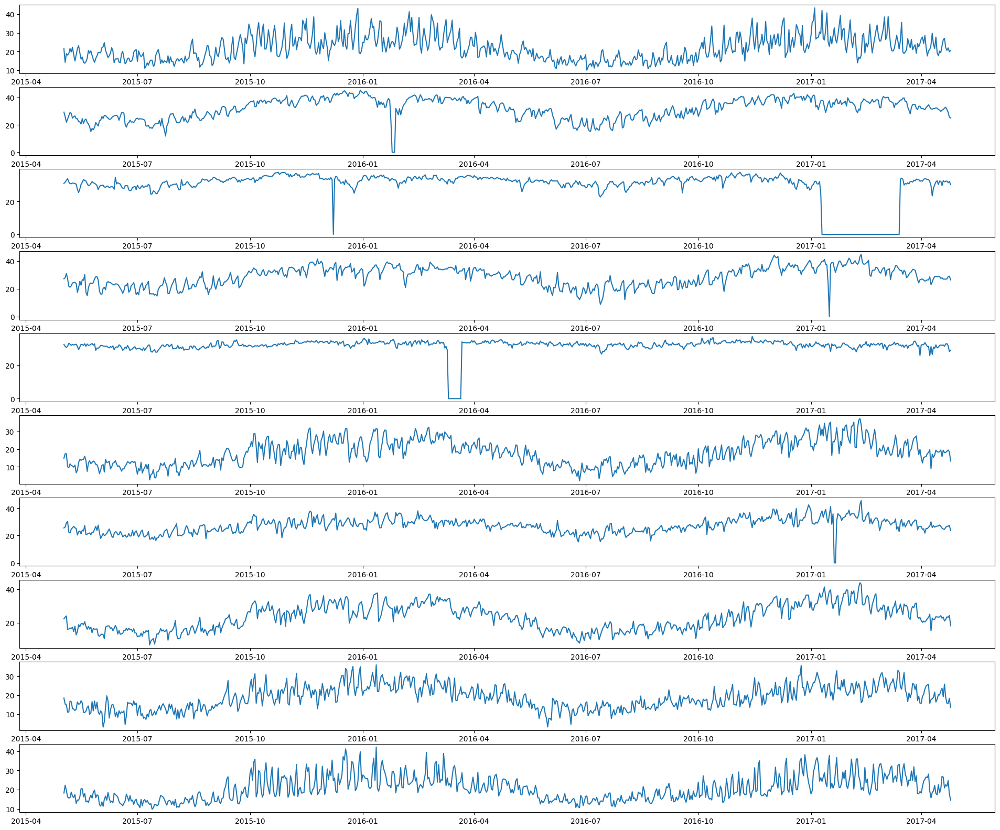

In [21]:
draw_resampled(temp_rain_tmax, 'D', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


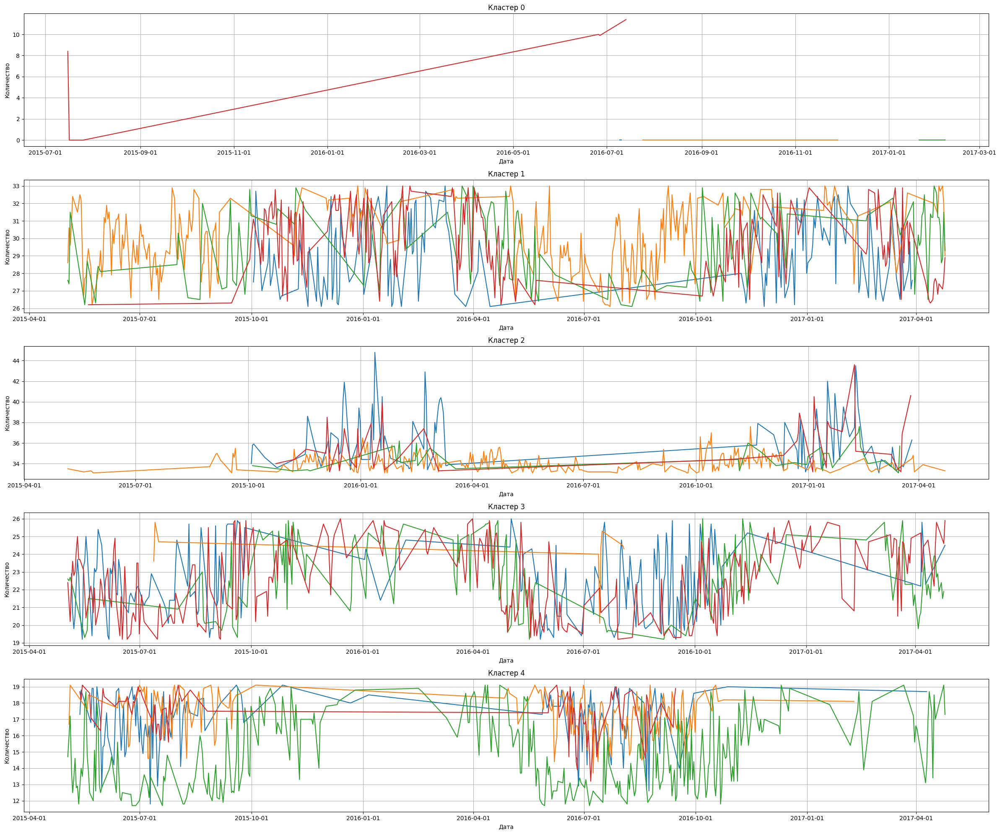

In [22]:
temperature_rain_cluster_max = cluster_ts(temp_rain_tmax, 5)
plot_clustered_series(temperature_rain_cluster_max, 5, n_series=4)

In [23]:
temp_rain_tmin = temperature_rain[(temperature_rain['obs_or_fcst'] == 'T_MIN')]
temp_rain_tmin

,id,obs_or_fcst,date,value
0,43,T_MIN,2015-05-02 15:00:00,7.1
1,43,T_MIN,2015-05-03 15:00:00,7.6
2,43,T_MIN,2015-05-04 15:00:00,8.0
3,43,T_MIN,2015-05-05 15:00:00,8.7
4,43,T_MIN,2015-05-06 15:00:00,8.7
...,...,...,...,...
720,32027,T_MIN,2017-04-21 15:00:00,11.3
721,32027,T_MIN,2017-04-22 15:00:00,15.4
722,32027,T_MIN,2017-04-23 15:00:00,14.8
723,32027,T_MIN,2017-04-24 15:00:00,13.0


In [24]:
describe_ts(temp_rain_tmin)

Число рядов: 422
Наблюдений в ряде: [725]
Минимальная дата в ряде: 2015-05-02 15:00:00
Максимальная дата в ряде: 2017-04-25 15:00:00, 

count    305950.000000
mean         12.583596
std           7.342409
min         -68.600000
25%           7.100000
50%          12.100000
75%          18.100000
max          33.800000
Name: value, dtype: float64


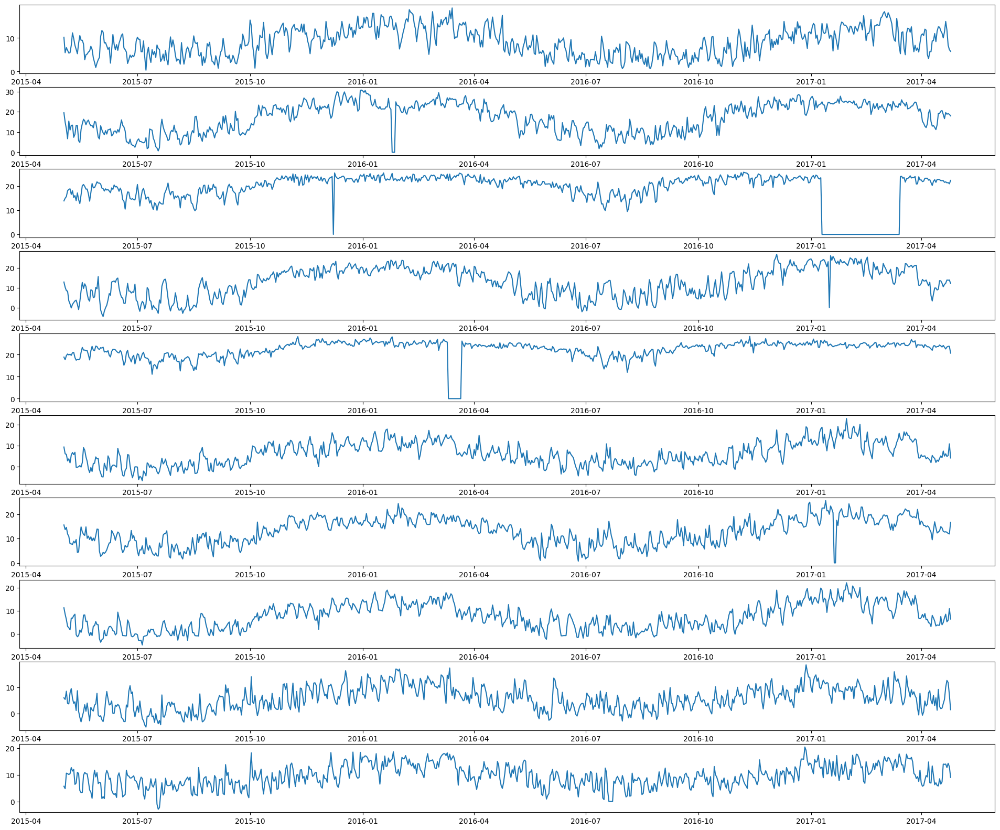

In [25]:
draw_resampled(temp_rain_tmin, 'D', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


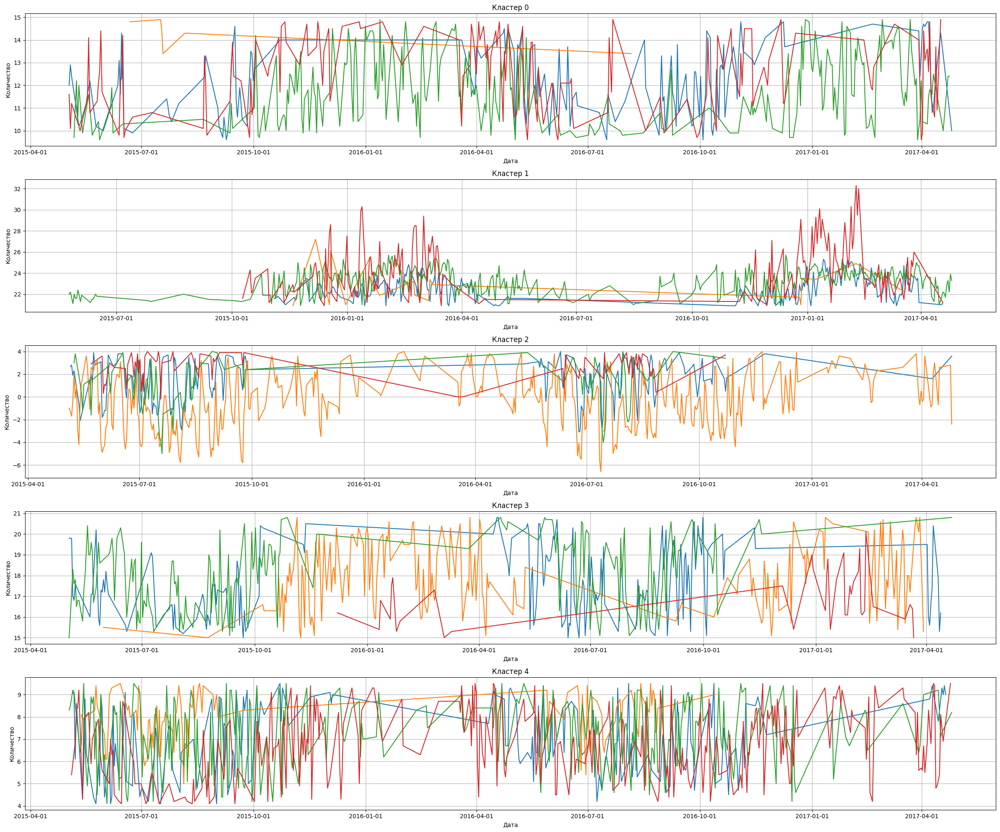

In [26]:
temperature_rain_cluster_min = cluster_ts(temp_rain_tmin, 5)
plot_clustered_series(temperature_rain_cluster_min, 5, n_series=4)

fcst_4_DailyPoP50

In [27]:
temp_rain_pop = temperature_rain[(temperature_rain['obs_or_fcst'] == 'fcst_4_DailyPoP50')]
temp_rain_pop

,id,obs_or_fcst,date,value
0,20,fcst_4_DailyPoP50,2015-05-02 15:00:00,0.0
1,20,fcst_4_DailyPoP50,2015-05-03 15:00:00,0.0
2,20,fcst_4_DailyPoP50,2015-05-04 15:00:00,1.0
3,20,fcst_4_DailyPoP50,2015-05-05 15:00:00,0.0
4,20,fcst_4_DailyPoP50,2015-05-06 15:00:00,0.0
...,...,...,...,...
720,32004,fcst_4_DailyPoP50,2017-04-21 15:00:00,0.0
721,32004,fcst_4_DailyPoP50,2017-04-22 15:00:00,0.0
722,32004,fcst_4_DailyPoP50,2017-04-23 15:00:00,0.0
723,32004,fcst_4_DailyPoP50,2017-04-24 15:00:00,0.0


In [28]:
describe_ts(temp_rain_pop)

Число рядов: 422
Наблюдений в ряде: [725]
Минимальная дата в ряде: 2015-05-02 15:00:00
Максимальная дата в ряде: 2017-04-25 15:00:00, 

count    305950.000000
mean          0.542383
std           2.139702
min           0.000000
25%           0.000000
50%           0.000000
75%           0.000000
max          84.000000
Name: value, dtype: float64


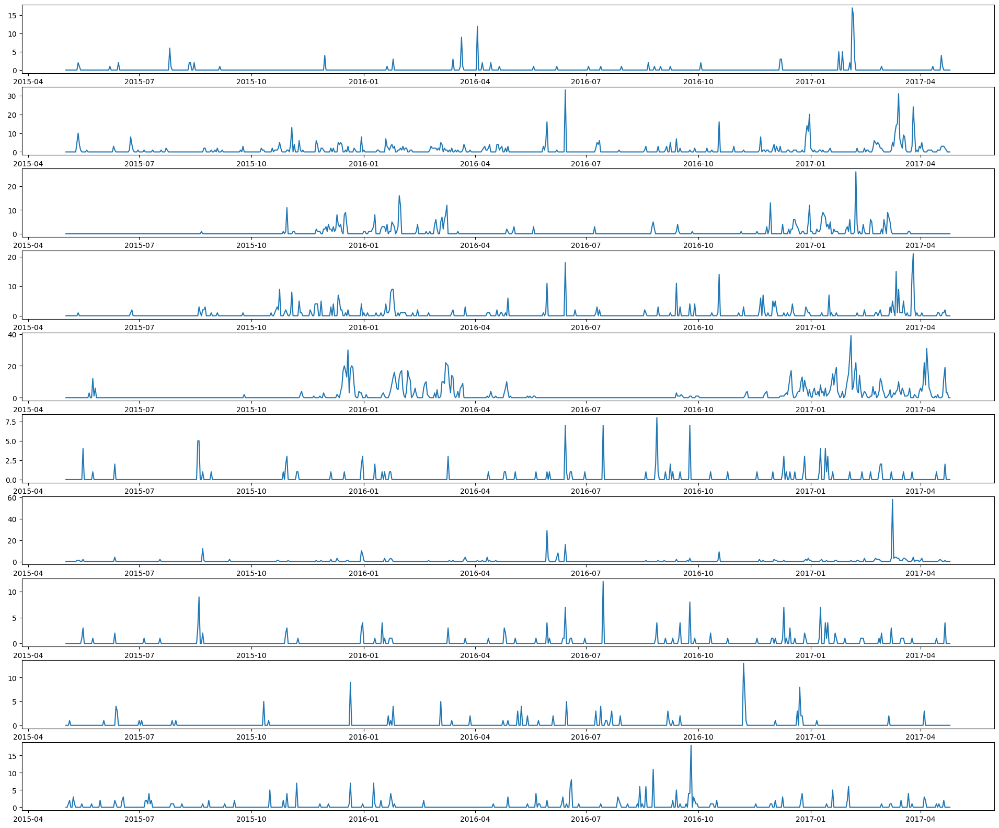

In [29]:
draw_resampled(temp_rain_pop, 'D', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


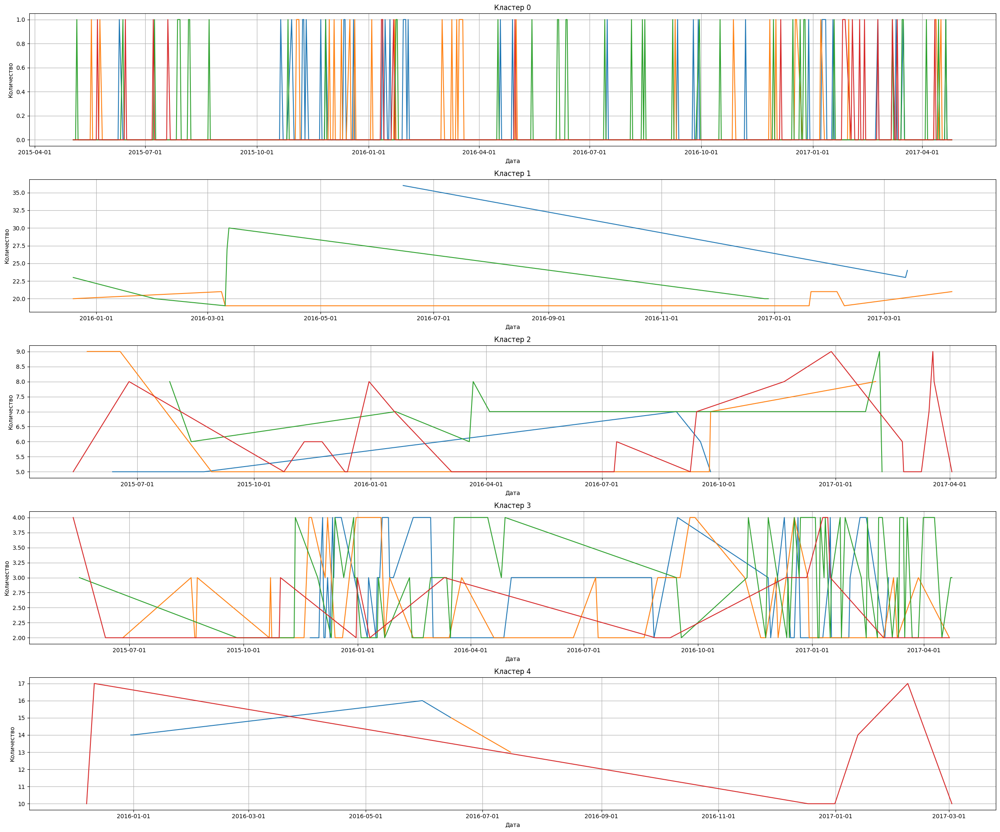

In [30]:
temperature_rain_cluster_pop = cluster_ts(temp_rain_pop, 5)
plot_clustered_series(temperature_rain_cluster_pop, 5, n_series=4)

fcst_4_DailyPrecip

In [31]:
temp_rain_precip = temperature_rain[(temperature_rain['obs_or_fcst'] == 'fcst_4_DailyPrecip')]
temp_rain_precip

,id,obs_or_fcst,date,value
0,21,fcst_4_DailyPrecip,2015-05-02 15:00:00,0.60002
1,21,fcst_4_DailyPrecip,2015-05-03 15:00:00,1.75770
2,21,fcst_4_DailyPrecip,2015-05-04 15:00:00,4.79286
3,21,fcst_4_DailyPrecip,2015-05-05 15:00:00,3.06000
4,21,fcst_4_DailyPrecip,2015-05-06 15:00:00,0.68594
...,...,...,...,...
720,32005,fcst_4_DailyPrecip,2017-04-21 15:00:00,1.08001
721,32005,fcst_4_DailyPrecip,2017-04-22 15:00:00,1.03100
722,32005,fcst_4_DailyPrecip,2017-04-23 15:00:00,1.73152
723,32005,fcst_4_DailyPrecip,2017-04-24 15:00:00,1.91686


In [32]:
describe_ts(temp_rain_precip)

Число рядов: 422
Наблюдений в ряде: [725]
Минимальная дата в ряде: 2015-05-02 15:00:00
Максимальная дата в ряде: 2017-04-25 15:00:00, 

count    305950.000000
mean          1.971099
std           4.148874
min           0.000000
25%           0.025013
50%           0.392650
75%           2.106150
max         522.404000
Name: value, dtype: float64


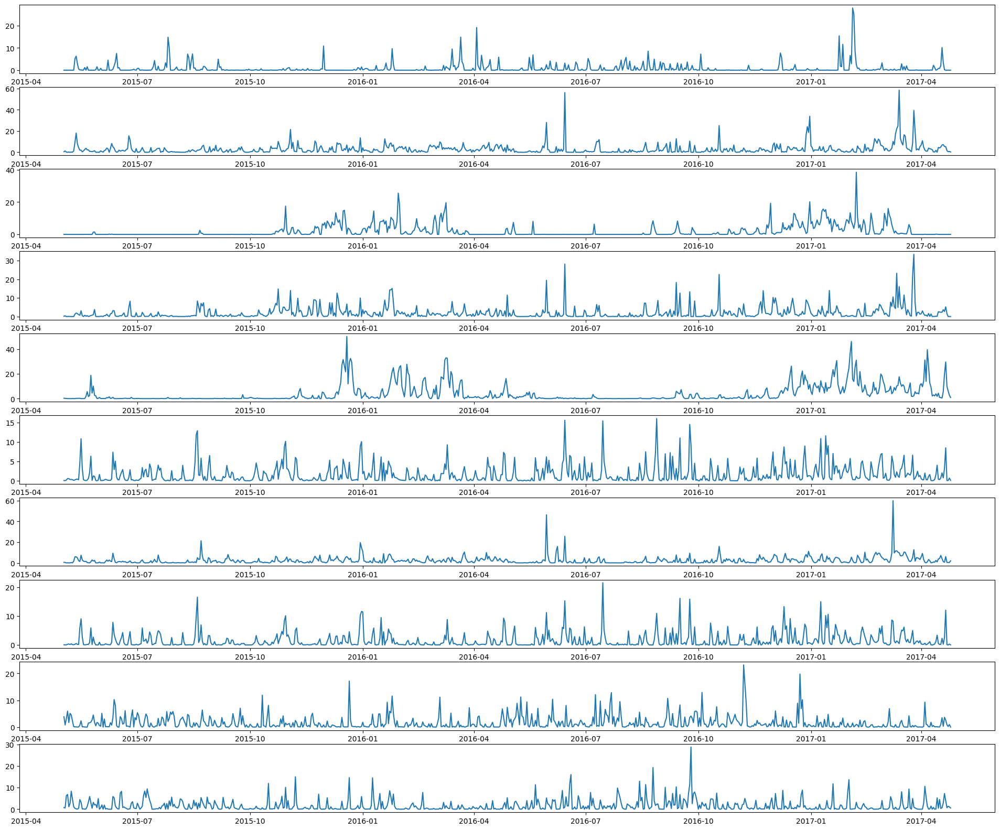

In [33]:
draw_resampled(temp_rain_precip, 'D', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


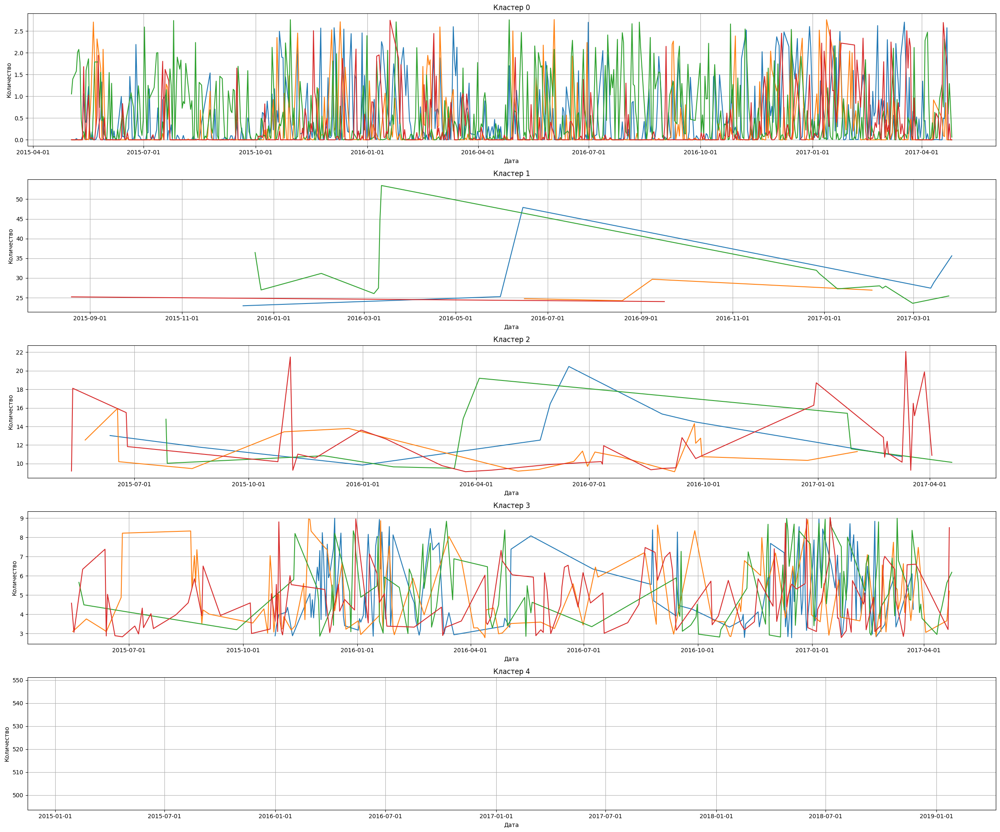

In [34]:
temperature_rain_cluster_precip = cluster_ts(temp_rain_precip, 5)
plot_clustered_series(temperature_rain_cluster_precip, 5, n_series=4)

# KDD Cup Dataset (without Missing Values)

This dataset was used in the KDD Cup 2018 forecasting competition. It contains long hourly time series representing the air quality levels in 59 stations in 2 cities: Beijing (35 stations) and London (24 stations) from 01/01/2017 to 31/03/2018. The air quality level is represented in multiple measurements such as PM2.5, PM10, NO2, CO, O3 and SO2.

The dataset uploaded here contains 270 hourly time series which have been categorized using city, station name and air quality measurement. 

In [35]:
data_frame2, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/kdd_cup_2018_dataset_without_missing_values.tsf"
)

In [36]:
data_frame2

,series_name,city,station,air_quality_measurement,start_timestamp,value
0,T1,Beijing,aotizhongxin_aq,PM2.5,2017-01-01 14:00:00,"[453.0, 417.0, 395.0, 420.0, 453.0, 429.0, 211..."
1,T2,Beijing,aotizhongxin_aq,PM10,2017-01-01 14:00:00,"[467.0, 443.0, 467.0, 484.0, 520.0, 520.0, 520..."
2,T3,Beijing,aotizhongxin_aq,NO2,2017-01-01 14:00:00,"[156.0, 143.0, 141.0, 139.0, 157.0, 141.0, 110..."
3,T4,Beijing,aotizhongxin_aq,CO,2017-01-01 14:00:00,"[7.2, 6.8, 6.9, 7.4, 7.6, 6.5, 3.3, 2.2, 1.3, ..."
4,T5,Beijing,aotizhongxin_aq,O3,2017-01-01 14:00:00,"[3.0, 2.0, 3.0, 3.0, 4.0, 3.0, 3.0, 4.0, 26.0,..."
...,...,...,...,...,...,...
265,T266,London,BX9,PM2.5,2017-01-01 00:00:01,"[23.3, 17.5, 16.6, 18.6, 20.4, 20.5, 21.2, 17...."
266,T267,London,KC1,PM2.5,2017-01-01 00:00:01,"[31.7, 29.9, 21.8, 19.1, 23.7, 25.7, 24.4, 20...."
267,T268,London,KC1,PM10,2017-01-01 00:00:01,"[23.2, 23.1, 13.9, 12.8, 13.8, 14.9, 15.1, 13...."
268,T269,London,KC1,NO2,2017-01-01 00:00:01,"[21.3, 25.9, 22.6, 23.4, 22.6, 24.9, 27.9, 30...."


In [134]:
frequency

'hourly'

In [135]:
forecast_horizon

In [136]:
contain_missing_values

False

In [138]:
contain_equal_length

False

In [140]:
value_counts = data_frame2['city'].value_counts()
value_counts

city
Beijing    210
London      60
Name: count, dtype: int64

In [141]:
value_counts = data_frame2['air_quality_measurement'].value_counts()
value_counts

air_quality_measurement
PM2.5    59
PM10     54
NO2      52
CO       35
O3       35
SO2      35
Name: count, dtype: int64

PM2.5: Мелкие частицы 2,5
Это крошечные частицы или капли в воздухе с диаметром 2,5 микрометра или меньше. PM2.5 может включать различные загрязнители, такие как пыль, грязь, сажу и жидкие капли. Эти частицы достаточно маленькие для вдыхания в дыхательную систему.

PM10: Мелкие частицы 10
Похожи на PM2.5, но включают частицы с диаметром 10 микрометров или меньше. PM10 также может содержать различные загрязнители и оказывать влияние на здоровье дыхательной системы.

NO2: Диоксид азота
Это красновато-коричневый газ, побочный продукт процессов сгорания, таких как в транспортных средствах и промышленных предприятиях. NO2 может способствовать проблемам с дыхательной системой и является ключевым компонентом атмосферного загрязнения.

CO: Оксид углерода
Бесцветный, без запаха газ, образующийся при неполном сгорании углеродсодержащих топлив. Высокие уровни оксида углерода могут быть вредными, так как он мешает транспортировке кислорода в организме.

O3: Озон
Озон в нижних слоях атмосферы является загрязнителем воздуха, образующимся, когда загрязнители, выбрасываемые транспортом, электростанциями, промышленными предприятиями и другими источниками, подвергаются химическим реакциям при наличии солнечного света. На уровне земли озон может вызывать проблемы с дыханием.

SO2: Диоксид серы
Бесцветный газ с резким запахом. Диоксид серы образуется при сжигании ископаемого топлива, содержащего серу, такого как уголь и нефть. Он может вызывать проблемы с дыханием и способствовать образованию кислотных дождей

Проверим каждый из загрязнителей по отдельности: PM2.5, PM10, NO2, CO, O3 and SO2

In [143]:
max(data_frame2['value'].apply(len))  # max N points

10920

In [144]:
min(data_frame2['value'].apply(len))  # min N points

9504

In [41]:
def melt_segment2(segment, id_column="id", city="city", var_column="air_quality_measurement", value_column="value", date_column="date"):
    n_values = len(segment["value"].values[0])
    df_dict = {
        "id": np.repeat(segment[id_column].iloc[0], n_values),
        "city": np.repeat(segment[city].iloc[0], n_values),
        "air_quality_measurement": np.repeat(segment[var_column].iloc[0], n_values),
        "date": pd.date_range(segment[date_column].iloc[0], periods=n_values, freq="H"),
        "value": segment[value_column].values[0]
    }
    return pd.DataFrame(df_dict)

In [42]:
air_quality = data_frame2.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
air_quality["date"] = pd.to_datetime(air_quality["date"])
air_quality['id'] = air_quality['id'].astype('category').cat.codes

In [43]:
new_df_list = []
for _, segment in air_quality.groupby("id"):
    new_df_list.append(melt_segment2(segment))

In [44]:
air_quality = pd.concat(new_df_list)
air_quality

,id,city,air_quality_measurement,date,value
0,0,Beijing,PM2.5,2017-01-01 14:00:00,453.0
1,0,Beijing,PM2.5,2017-01-01 15:00:00,417.0
2,0,Beijing,PM2.5,2017-01-01 16:00:00,395.0
3,0,Beijing,PM2.5,2017-01-01 17:00:00,420.0
4,0,Beijing,PM2.5,2017-01-01 18:00:00,453.0
...,...,...,...,...,...
10893,269,Beijing,NO2,2018-03-31 11:00:00,43.0
10894,269,Beijing,NO2,2018-03-31 12:00:00,38.0
10895,269,Beijing,NO2,2018-03-31 13:00:00,32.0
10896,269,Beijing,NO2,2018-03-31 14:00:00,34.0


In [45]:
air_quality.to_csv('./kdd_cup_2018.csv', index=False)

O3

In [46]:
# Выбор подтаблицы
subtable_O3 = air_quality[(air_quality['city'] == 'Beijing') & (air_quality['air_quality_measurement'] == 'O3')]
subtable_O3

,id,city,air_quality_measurement,date,value
0,3,Beijing,O3,2017-01-01 14:00:00,2.0
1,3,Beijing,O3,2017-01-01 15:00:00,2.0
2,3,Beijing,O3,2017-01-01 16:00:00,2.0
3,3,Beijing,O3,2017-01-01 17:00:00,2.0
4,3,Beijing,O3,2017-01-01 18:00:00,2.0
...,...,...,...,...,...
10893,265,Beijing,O3,2018-03-31 11:00:00,106.0
10894,265,Beijing,O3,2018-03-31 12:00:00,76.0
10895,265,Beijing,O3,2018-03-31 13:00:00,39.0
10896,265,Beijing,O3,2018-03-31 14:00:00,2.0


In [47]:
describe_ts(subtable_O3)

Число рядов: 35
Наблюдений в ряде: [10898]
Минимальная дата в ряде: 2017-01-01 14:00:00
Максимальная дата в ряде: 2018-03-31 15:00:00, 

count    381430.000000
mean         62.425129
std          63.406256
min           1.000000
25%          15.000000
50%          49.000000
75%          84.000000
max         504.000000
Name: value, dtype: float64


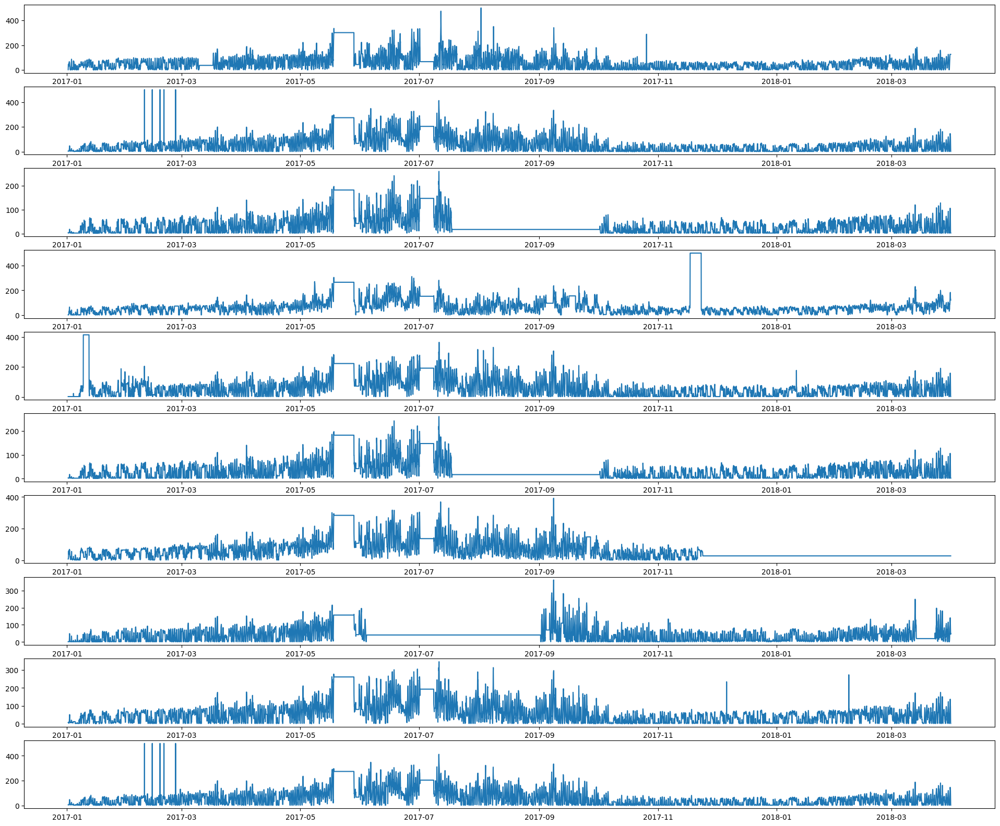

In [48]:
draw_resampled(subtable_O3, 'H', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


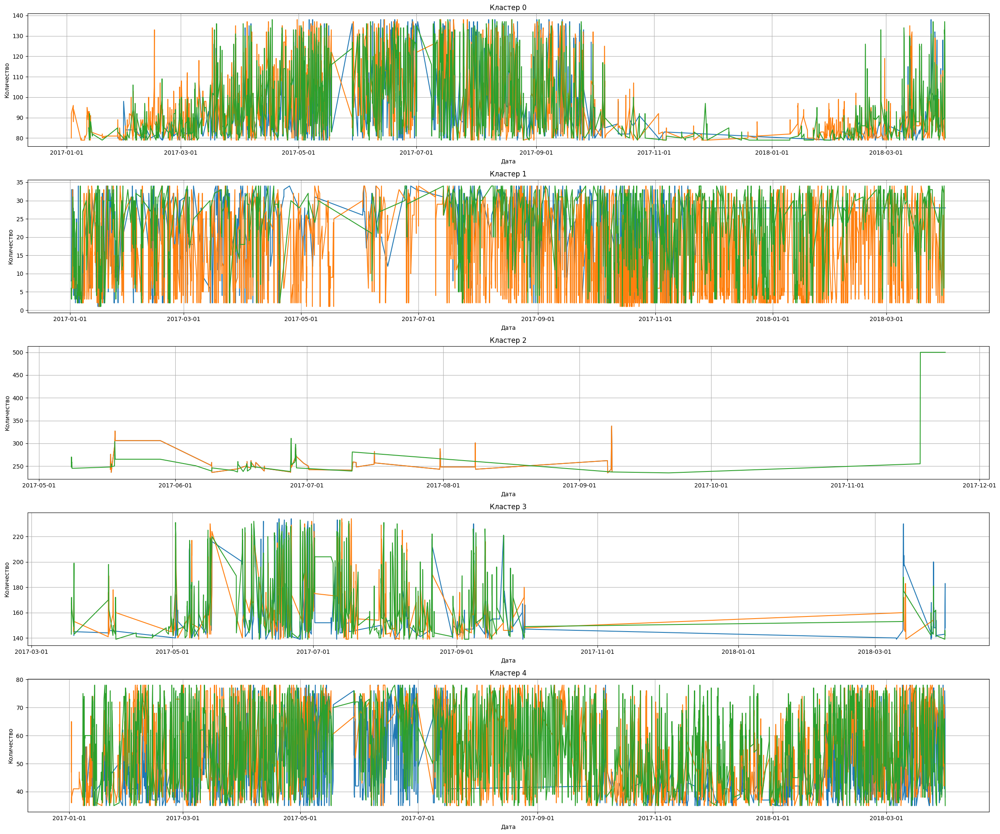

In [50]:
kdd_cup_c_cluster_O3 = cluster_ts(subtable_O3, 5)
plot_clustered_series(kdd_cup_c_cluster_O3, 5, n_series=3)

PM2.5

In [51]:
# Выбор подтаблицы
subtable_PM = air_quality[(air_quality['city'] == 'Beijing') & (air_quality['air_quality_measurement'] == 'PM2.5')]
subtable_PM

,id,city,air_quality_measurement,date,value
0,0,Beijing,PM2.5,2017-01-01 14:00:00,453.0
1,0,Beijing,PM2.5,2017-01-01 15:00:00,417.0
2,0,Beijing,PM2.5,2017-01-01 16:00:00,395.0
3,0,Beijing,PM2.5,2017-01-01 17:00:00,420.0
4,0,Beijing,PM2.5,2017-01-01 18:00:00,453.0
...,...,...,...,...,...
10893,267,Beijing,PM2.5,2018-03-31 11:00:00,97.0
10894,267,Beijing,PM2.5,2018-03-31 12:00:00,102.0
10895,267,Beijing,PM2.5,2018-03-31 13:00:00,102.0
10896,267,Beijing,PM2.5,2018-03-31 14:00:00,110.0


In [52]:
describe_ts(subtable_PM)

Число рядов: 35
Наблюдений в ряде: [10898]
Минимальная дата в ряде: 2017-01-01 14:00:00
Максимальная дата в ряде: 2018-03-31 15:00:00, 

count    381430.000000
mean         61.381323
std          66.620495
min           2.000000
25%          16.000000
50%          42.000000
75%          84.000000
max        1574.000000
Name: value, dtype: float64


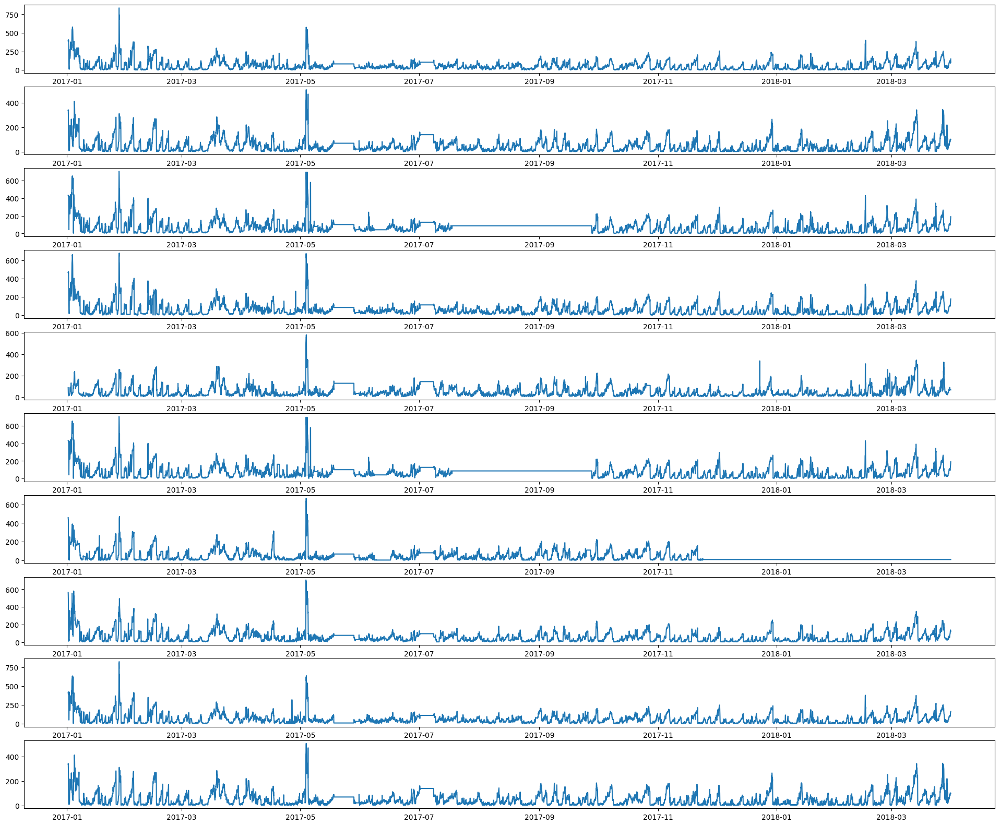

In [53]:
draw_resampled(subtable_PM, 'H', 10)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/home/olga/ts_year_project/ts/eda/utils.py:209: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['cluster'] = clusters


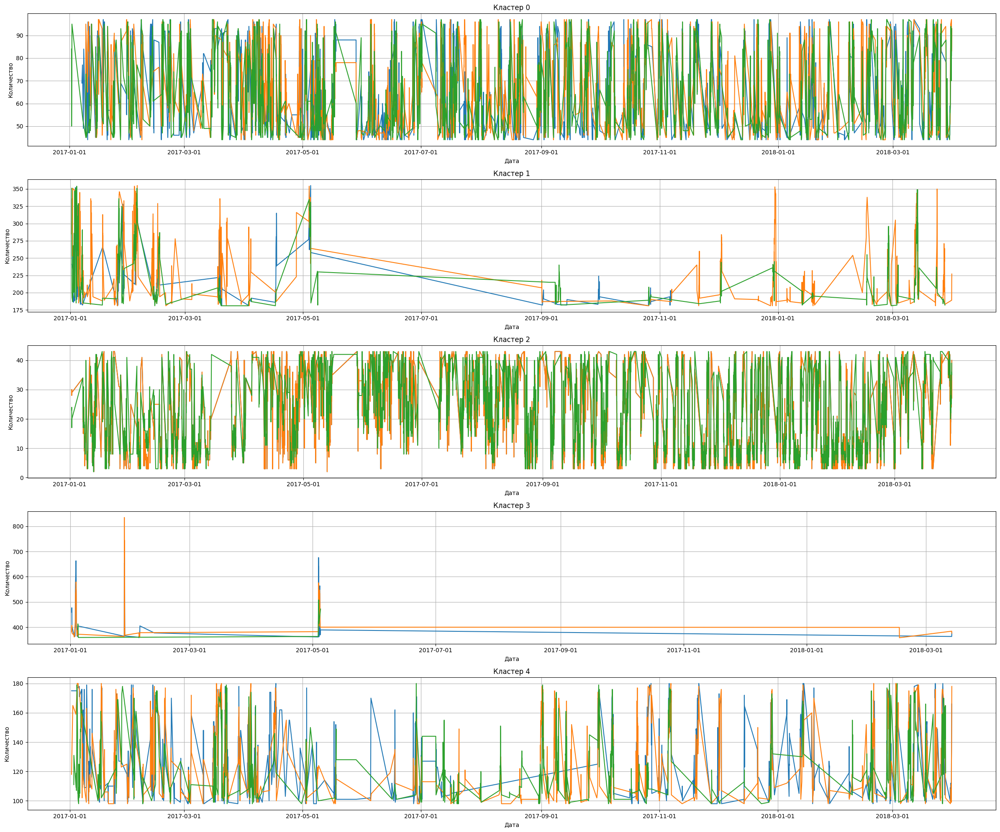

In [54]:
kdd_cup_c_cluster_PM = cluster_ts(subtable_PM, 5)
plot_clustered_series(kdd_cup_c_cluster_PM, 5, n_series=3)

# covid_deaths_dataset

This dataset contains 266 daily time series that represent the COVID-19 deaths in a set of countries and states from 22/01/2020 to 20/08/2020. It was extracted from the Johns Hopkins repository.

In [59]:
data_frame3, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/covid_deaths_dataset.tsf"
)

In [60]:
data_frame3

,series_name,start_timestamp,value
0,T1,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,T2,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,T3,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,T4,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,T5,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...
261,T262,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
262,T263,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
263,T264,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
264,T265,2020-01-22,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."


In [67]:
def melt_segment(segment, id_column="id", value_column="value", date_column="date"):
    n_values = len(segment["value"].values[0])
    df_dict = {
        "id": np.repeat(segment[id_column].iloc[0], n_values),
        "date": pd.date_range(segment[date_column].iloc[0], periods=n_values, freq="D"),
        "value": segment[value_column].values[0]
    }
    return pd.DataFrame(df_dict)

In [68]:
covid_deaths = convert_tsf_to_dataframe('/media/olga/Disk/datasets_ts/covid_deaths_dataset.tsf')[0]
covid_deaths = covid_deaths.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
covid_deaths["date"] = pd.to_datetime(covid_deaths["date"])
covid_deaths['id'] = covid_deaths['id'].astype('category').cat.codes

In [69]:
new_df_list = []
for _, segment in covid_deaths.groupby("id"):
    new_df_list.append(melt_segment(segment))

In [70]:
covid_deaths_t = pd.concat(new_df_list)

In [71]:
covid_deaths_t

,id,date,value
0,0,2020-01-22,0.0
1,0,2020-01-23,0.0
2,0,2020-01-24,0.0
3,0,2020-01-25,0.0
4,0,2020-01-26,0.0
...,...,...,...
207,265,2020-08-16,397.0
208,265,2020-08-17,399.0
209,265,2020-08-18,401.0
210,265,2020-08-19,404.0


In [74]:
covid_deaths_t.to_csv('./covid_deaths.csv', index=False)

Приведем основные необходимые характеристики ряда.

In [72]:
describe_ts(covid_deaths_t)

Число рядов: 266
Наблюдений в ряде: [212]
Минимальная дата в ряде: 2020-01-22 00:00:00
Максимальная дата в ряде: 2020-08-20 00:00:00, 

count     56392.000000
mean       1076.666265
std        7405.257144
min           0.000000
25%           0.000000
50%           3.000000
75%          46.000000
max      174255.000000
Name: value, dtype: float64


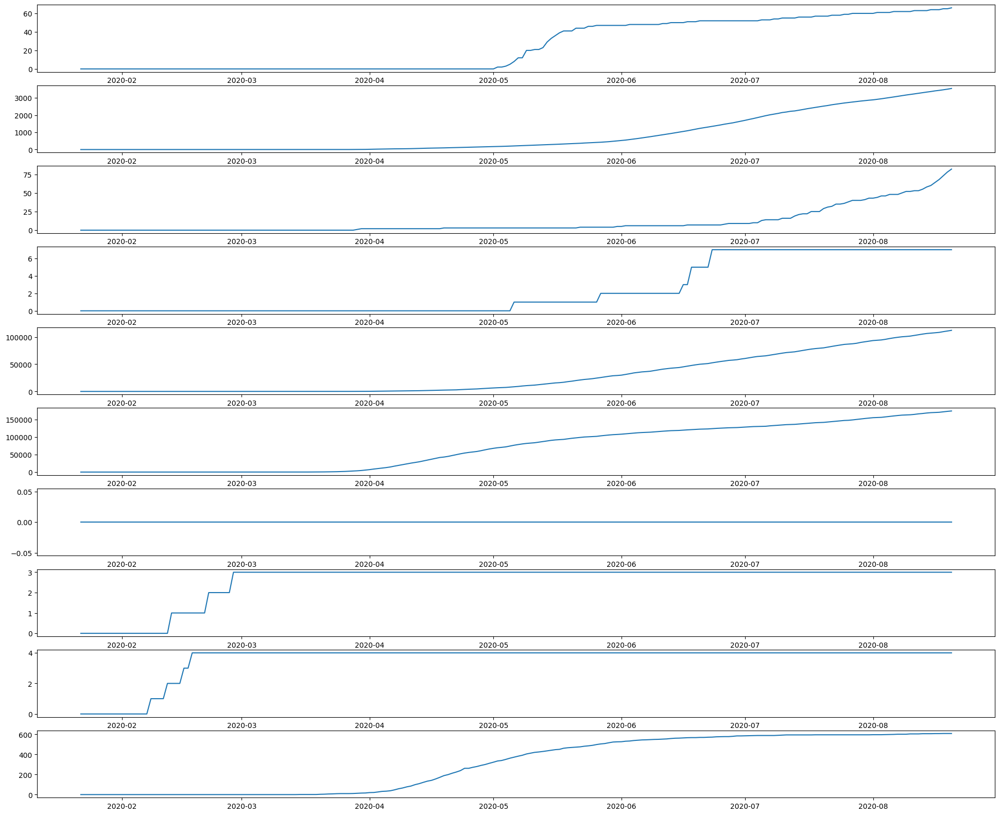

In [73]:
draw_resampled(covid_deaths_t, 'D', 10)

Ряды разнородны. Наблюдается восходящий тренд

Кластеризуем

In [75]:
covid_deaths_cluster = cluster_ts(covid_deaths_t, 7)

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


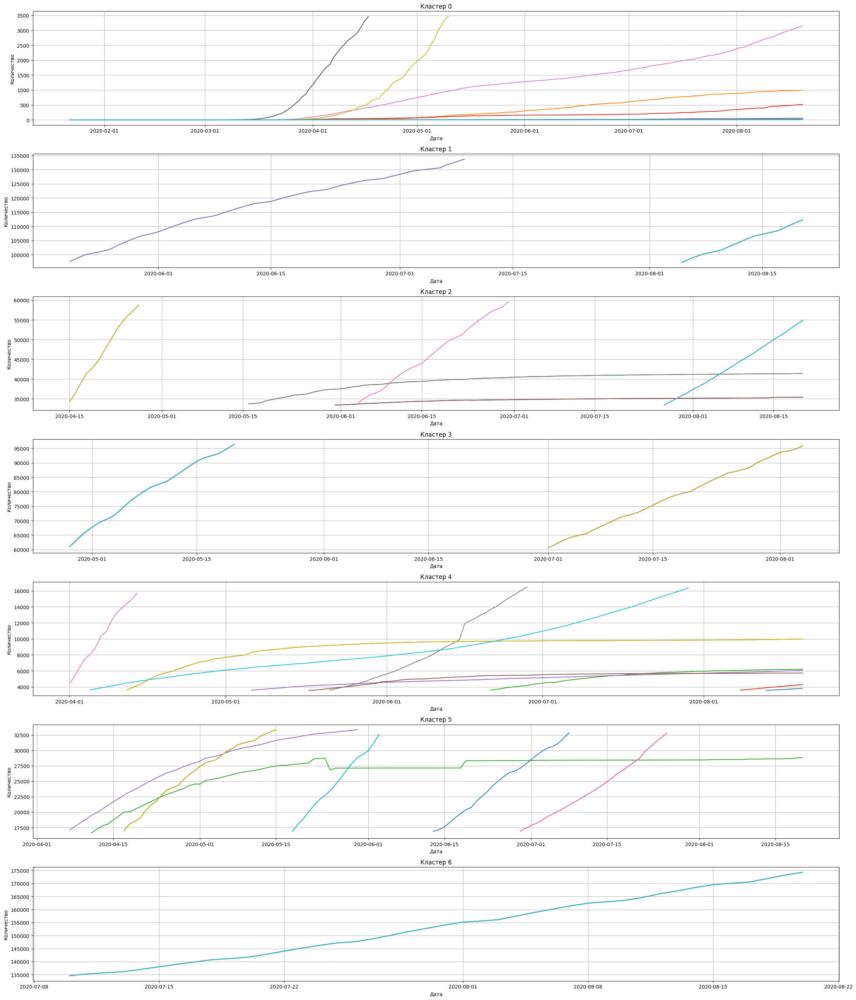

In [76]:
plot_clustered_series(covid_deaths_cluster, 7, n_series=10)

# hospital_dataset.tsf

This dataset contains 767 monthly time series that represent the patient counts related to medical products from January 2000 to December 2006

In [77]:
data_frame4, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/hospital_dataset.tsf"
)

In [78]:
data_frame4

,series_name,start_timestamp,value
0,T1,2000-01-01,"[27.0, 16.0, 18.0, 19.0, 21.0, 20.0, 20.0, 23...."
1,T2,2000-01-01,"[10.0, 7.0, 14.0, 9.0, 18.0, 14.0, 8.0, 22.0, ..."
2,T3,2000-01-01,"[194.0, 184.0, 208.0, 190.0, 217.0, 211.0, 212..."
3,T4,2000-01-01,"[77.0, 76.0, 89.0, 73.0, 80.0, 85.0, 81.0, 81...."
4,T5,2000-01-01,"[21.0, 15.0, 8.0, 15.0, 18.0, 14.0, 17.0, 25.0..."
...,...,...,...
762,T763,2000-01-01,"[21.0, 15.0, 22.0, 12.0, 28.0, 24.0, 11.0, 27...."
763,T764,2000-01-01,"[18.0, 22.0, 31.0, 22.0, 41.0, 33.0, 31.0, 46...."
764,T765,2000-01-01,"[28.0, 25.0, 29.0, 24.0, 33.0, 37.0, 31.0, 36...."
765,T766,2000-01-01,"[263.0, 259.0, 281.0, 313.0, 351.0, 302.0, 262..."


In [79]:
hospital_dataset = convert_tsf_to_dataframe('/media/olga/Disk/datasets_ts/hospital_dataset.tsf')[0]
hospital_dataset = hospital_dataset.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
hospital_dataset["date"] = pd.to_datetime(hospital_dataset["date"])
hospital_dataset['id'] = hospital_dataset['id'].astype('category').cat.codes

In [80]:
new_df_list = []
for _, segment in hospital_dataset.groupby("id"):
    new_df_list.append(melt_segment(segment))

In [81]:
hospital_dataset = pd.concat(new_df_list)

In [82]:
hospital_dataset

,id,date,value
0,0,2000-01-01,27.0
1,0,2000-01-02,16.0
2,0,2000-01-03,18.0
3,0,2000-01-04,19.0
4,0,2000-01-05,21.0
...,...,...,...
79,766,2000-03-20,10.0
80,766,2000-03-21,9.0
81,766,2000-03-22,10.0
82,766,2000-03-23,6.0


In [83]:
hospital_dataset.to_csv('./hospital_dataset.csv', index=False)

In [84]:
describe_ts(hospital_dataset)

Число рядов: 767
Наблюдений в ряде: [84]
Минимальная дата в ряде: 2000-01-01 00:00:00
Максимальная дата в ряде: 2000-03-24 00:00:00, 

count    64428.000000
mean       267.212858
std        835.499215
min          1.000000
25%         18.000000
50%         38.000000
75%        152.000000
max      12090.000000
Name: value, dtype: float64


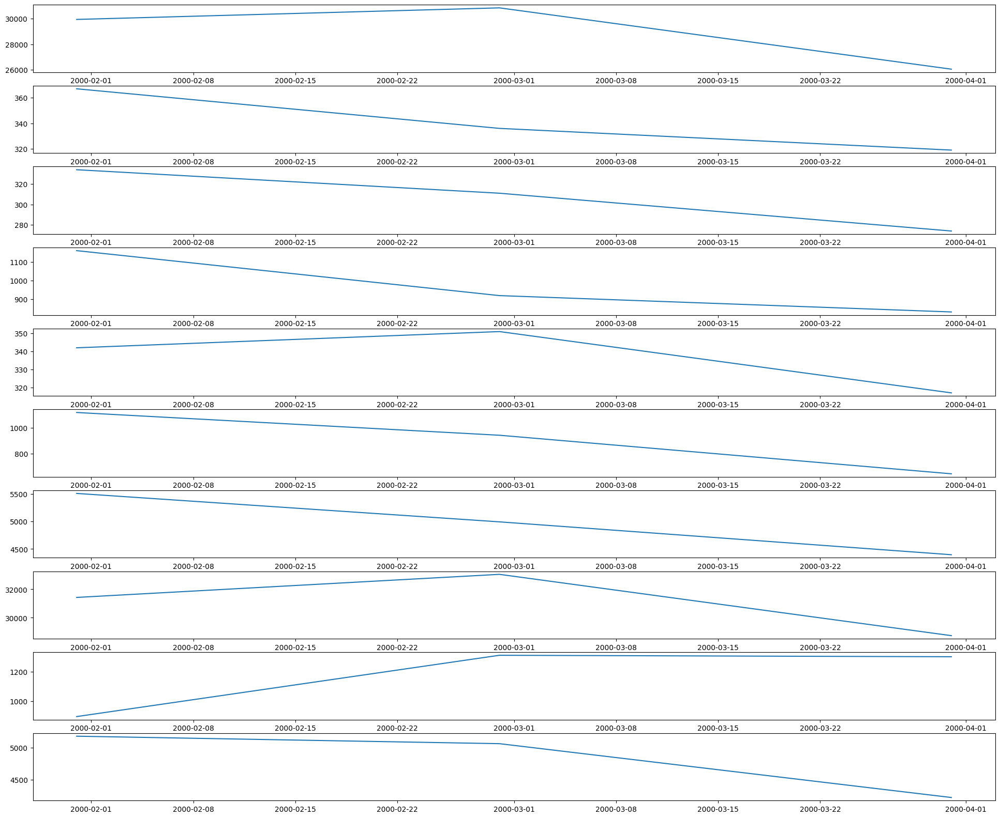

In [85]:
draw_resampled(hospital_dataset, 'M', 10)

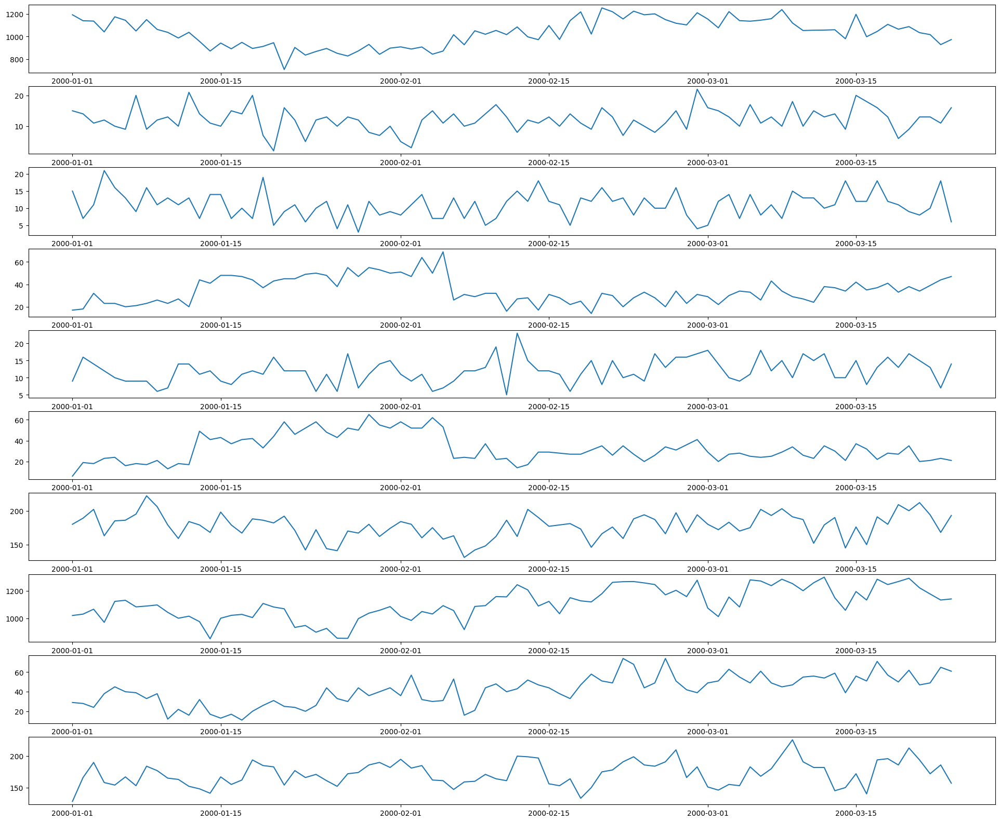

In [86]:
draw_resampled(hospital_dataset, 'D', 10)

In [53]:
frequency

'monthly'

In [54]:
forecast_horizon

In [55]:
contain_missing_values

False

In [56]:
contain_equal_length

True

In [58]:
max(data_frame4['value'].apply(len)) # max N points

84

Ряды разнородны. Тренд где-то есть, где-то нет

/home/olga/hse_master/develop_tools/fast_api/fast_api_tutorial/venv/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


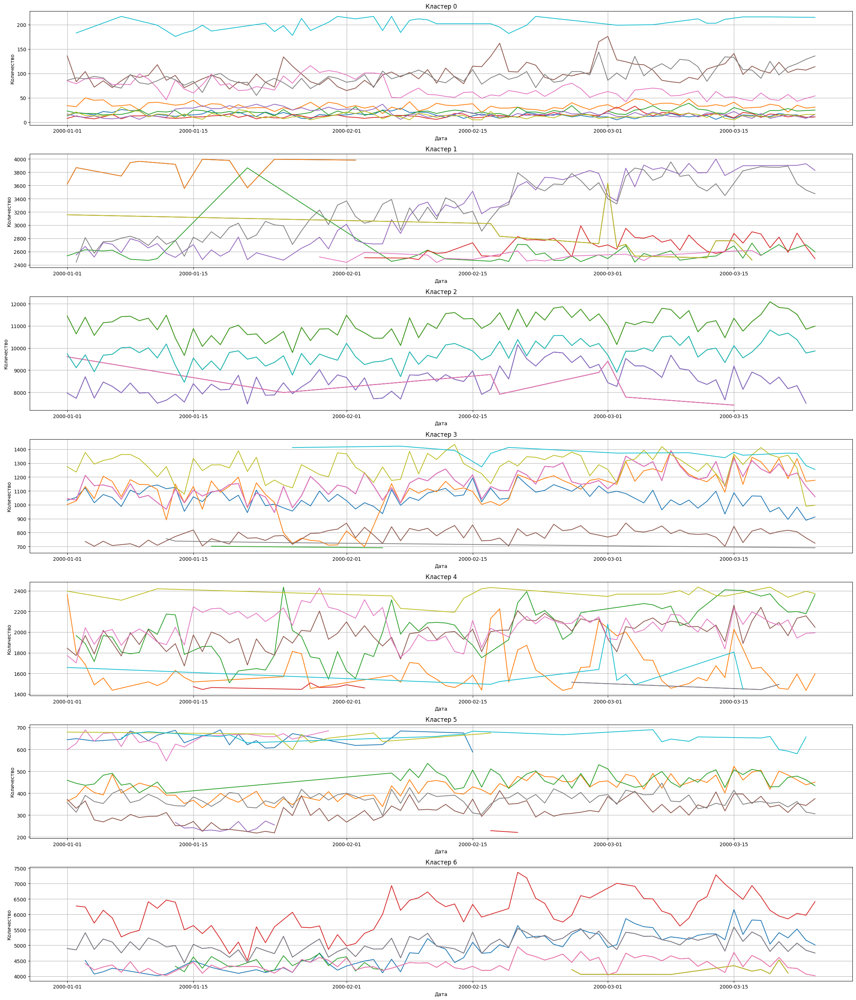

In [87]:
covid_deaths_cluster = cluster_ts(hospital_dataset, 7)
plot_clustered_series(covid_deaths_cluster, 7, n_series=10)

# saugeenday_dataset

This dataset contains a single very long time series representing the daily mean flow of the Saugeen River at Walkerton in cubic meters per second from 01/01/1915 to 31/12/1979. It was extracted from R deseasonalize package. The length of this time series is 23741.

In [88]:
data_frame5, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/saugeenday_dataset.tsf"
)

In [89]:
data_frame5

,series_name,start_timestamp,value
0,T1,1915-01-01,"[11.5, 10.8, 13.7, 13.7, 14.4, 17.0, 17.0, 17...."


In [90]:
data_frame5.dtypes

series_name                object
start_timestamp    datetime64[ns]
value                      object
dtype: object

In [91]:
saugeenday_dataset = data_frame5.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
saugeenday_dataset["date"] = pd.to_datetime(saugeenday_dataset["date"])
saugeenday_dataset['id'] = saugeenday_dataset['id'].astype('category').cat.codes
new_df_list = []
for _, segment in saugeenday_dataset.groupby("id"):
    new_df_list.append(melt_segment(segment))
saugeenday_dataset = pd.concat(new_df_list)
saugeenday_dataset

,id,date,value
0,0,1915-01-01,11.5
1,0,1915-01-02,10.8
2,0,1915-01-03,13.7
3,0,1915-01-04,13.7
4,0,1915-01-05,14.4
...,...,...,...
23736,0,1979-12-27,121.0
23737,0,1979-12-28,79.9
23738,0,1979-12-29,59.5
23739,0,1979-12-30,49.3


In [93]:
saugeenday_dataset.to_csv('./saugeenday.csv', index=False)

In [94]:
frequency

'daily'

In [35]:
forecast_horizon

In [36]:
contain_missing_values

False

In [37]:
contain_equal_length

True

In [39]:
max(data_frame5['value'].apply(len)) # max N points

23741

Тренда нет

In [95]:
describe_ts(saugeenday_dataset)

Число рядов: 1
Наблюдений в ряде: [23741]
Минимальная дата в ряде: 1915-01-01 00:00:00
Максимальная дата в ряде: 1979-12-31 00:00:00, 

count    23741.000000
mean        30.064290
std         39.163798
min          2.300000
25%          9.900000
50%         17.300000
75%         34.000000
max        640.000000
Name: value, dtype: float64


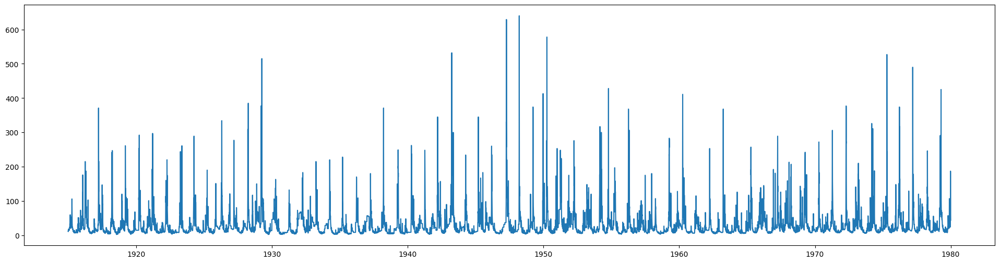

In [97]:
draw_resampled(saugeenday_dataset, 'D', 1)

# sunspot_dataset_without_missing_values

This dataset contains a single very long daily time series of sunspot numbers from 1818-01-08 to 2020-05-31. 

The original dataset contains missing values and they were replaced by carrying forward the corresponding last observations (LOCF method).

In [99]:
data_frame6, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/sunspot_dataset_without_missing_values.tsf"
)

In [100]:
data_frame6

,series_name,start_timestamp,value
0,T1,1818-01-08,"[65.0, 65.0, 65.0, 65.0, 65.0, 37.0, 37.0, 37...."


In [45]:
frequency

'daily'

In [46]:
forecast_horizon

In [47]:
contain_missing_values

False

In [48]:
contain_equal_length

True

In [49]:
data_frame6['value'].apply(len) # N points

0    73924
Name: value, dtype: int64

In [101]:
sunspot_dataset = data_frame6.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
sunspot_dataset["date"] = pd.to_datetime(sunspot_dataset["date"])
sunspot_dataset['id'] = sunspot_dataset['id'].astype('category').cat.codes
new_df_list = []
for _, segment in sunspot_dataset.groupby("id"):
    new_df_list.append(melt_segment(segment))
sunspot_dataset = pd.concat(new_df_list)
sunspot_dataset

,id,date,value
0,0,1818-01-08,65.0
1,0,1818-01-09,65.0
2,0,1818-01-10,65.0
3,0,1818-01-11,65.0
4,0,1818-01-12,65.0
...,...,...,...
73919,0,2020-05-27,0.0
73920,0,2020-05-28,0.0
73921,0,2020-05-29,0.0
73922,0,2020-05-30,0.0


In [103]:
sunspot_dataset.to_csv('./sunspot.csv', index=False)

In [104]:
describe_ts(sunspot_dataset)

Число рядов: 1
Наблюдений в ряде: [73924]
Минимальная дата в ряде: 1818-01-08 00:00:00
Максимальная дата в ряде: 2020-05-31 00:00:00, 

count    73924.000000
mean        83.647773
std         77.873408
min          0.000000
25%         22.000000
50%         63.000000
75%        128.000000
max        528.000000
Name: value, dtype: float64


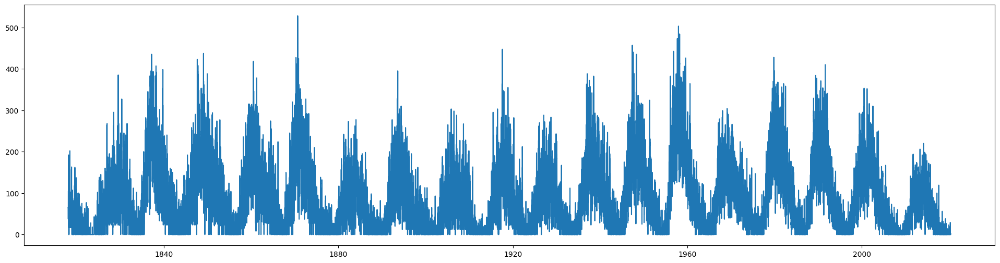

In [105]:
draw_resampled(sunspot_dataset, 'D', 1)

# us_births_dataset

This dataset contains a single very long daily time series representing the number of births in US from 01/01/1969 to 31/12/1988. It was extracted from R mosaicData package. The length of this time series is 7305.

In [106]:
data_frame7, frequency, forecast_horizon, contain_missing_values, contain_equal_length = convert_tsf_to_dataframe(
    full_file_path_and_name="/media/olga/Disk/datasets_ts/us_births_dataset.tsf"
)

In [107]:
data_frame7['value'].apply(len) # N points

0    7305
Name: value, dtype: int64

In [108]:
data_frame7

,series_name,start_timestamp,value
0,T1,1969-01-01,"[8486.0, 9002.0, 9542.0, 8960.0, 8390.0, 9560...."


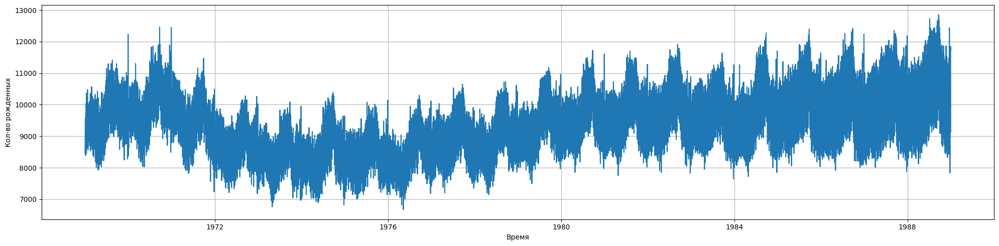

In [52]:
from matplotlib import pyplot as plt
import pandas as pd

fig, axes = plt.subplots(1, 1, figsize=(20, 5))

date_range_w = pd.date_range(start='1969-01-01', periods=len(data_frame7['value'][0]),freq='D')

axes.plot(date_range_w, data_frame7['value'][0])
axes.set_xlabel('Время')
axes.set_ylabel('Кол-во рожденных')
axes.grid(True)

plt.tight_layout()
plt.show()

In [23]:
frequency

'daily'

In [24]:
forecast_horizon

In [25]:
contain_missing_values

False

In [26]:
contain_equal_length

True

In [109]:
us_births_dataset = data_frame7.rename(columns={'series_name': 'id', 'start_timestamp': 'date'})
us_births_dataset["date"] = pd.to_datetime(us_births_dataset["date"])
us_births_dataset['id'] = us_births_dataset['id'].astype('category').cat.codes
new_df_list = []
for _, segment in us_births_dataset.groupby("id"):
    new_df_list.append(melt_segment(segment))
us_births_dataset = pd.concat(new_df_list)
us_births_dataset

,id,date,value
0,0,1969-01-01,8486.0
1,0,1969-01-02,9002.0
2,0,1969-01-03,9542.0
3,0,1969-01-04,8960.0
4,0,1969-01-05,8390.0
...,...,...,...
7300,0,1988-12-27,11528.0
7301,0,1988-12-28,11847.0
7302,0,1988-12-29,11704.0
7303,0,1988-12-30,11837.0


In [110]:
us_births_dataset.to_csv('./us_births_dataset.csv', index=False)

In [111]:
describe_ts(us_births_dataset)

Число рядов: 1
Наблюдений в ряде: [7305]
Минимальная дата в ряде: 1969-01-01 00:00:00
Максимальная дата в ряде: 1988-12-31 00:00:00, 

count     7305.000000
mean      9648.940178
std       1127.315229
min       6675.000000
25%       8792.000000
50%       9622.000000
75%      10510.000000
max      12851.000000
Name: value, dtype: float64


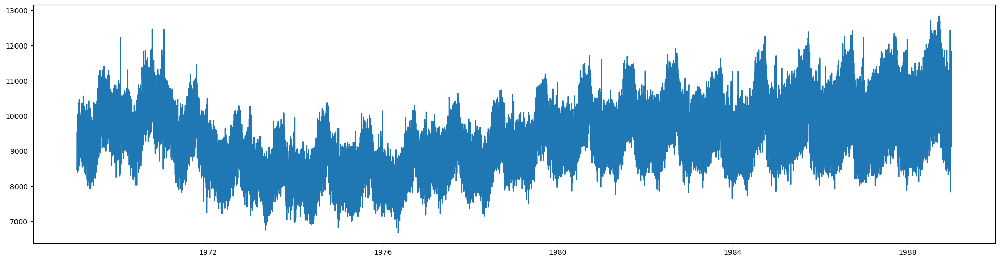

In [112]:
draw_resampled(us_births_dataset, 'D', 1)